#  Minimize the Function

# PSO

In [1]:
import random
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import animation
from numpy.core.fromnumeric import mean

In [2]:
def objective_function(x1,x2):
  return (x2-x1)**4 + 12*x1*x2 -x1 + x2 -3

Velocity Updation

In [3]:
def update_velocity(particle, velocity, pbest, gbest, w_min=0.5, max=1.0, c=0.1):
  
  # Initialise new velocity array
  num_particle = len(particle)
  new_velocity = np.array([0.0 for i in range(num_particle)])
  
  # Randomly generate r1, r2 and inertia weight from normal distribution
  r1 = random.uniform(0,max)
  r2 = random.uniform(0,max)
  w = random.uniform(w_min,max)
  
  c1 = c
  c2 = c
  
  # Calculate new velocity
  for i in range(num_particle):
    new_velocity[i] = w*velocity[i] + c1*r1*(pbest[i]-particle[i])+c2*r2*(gbest[i]-particle[i])
  return new_velocity

Position Updation

In [4]:
def update_position(particle, velocity):
  # Move particles by adding velocity
  new_particle = particle + velocity
  return new_particle

In [17]:
best=[]
average=[]
worst=[]

def PSO(population, dimension, position_min, position_max, generation, fitness_criterion):

  # Population
  particles = [[random.uniform(position_min, position_max) for j in range(dimension)] for i in range(population)]

  # Initializing best position
  pbest_position = particles
  
  # Fitness values of particles 
  pbest_fitness = [objective_function(p[0],p[1]) for p in particles]

  velocity = [[0.0 for j in range(dimension)] for i in range(population)]
  
  for t in range(generation):
    if np.average(pbest_fitness) <= fitness_criterion:
      break
    else:
      for n in range(population):
        # Update the velocity of each particle
        velocity[n] = update_velocity(particles[n], velocity[n], pbest_position[n], gbest_position)
        # Update the particles to new position
        particles[n] = update_position(particles[n], velocity[n])

    # The fitness value
    pbest_fitness = [objective_function(p[0],p[1]) for p in particles]

    # Find the index of the best particle
    gbest_index = np.argmin(pbest_fitness)
    # Update the position of the best particle
    gbest_position = pbest_position[gbest_index]

    # Find the index of the Worst particle
    gworst_index = np.argmax(pbest_fitness)
    # Update the position of the Worst particle
    gworst_position = pbest_position[gworst_index]

    # Find the index of the Average particle
    pbest_fitness_sorted=sorted(pbest_fitness)
    # find the index of the closest value to the median in a
    med=np.median(pbest_fitness_sorted)
    # idx = np.nanargmin(np.abs(a-amedian))
    gavg_index = np.nanargmin(np.abs(pbest_fitness-med)) 
    # Update the position of the Average particle
    gavg_position = pbest_position[gavg_index]

    # Print the results
    print('Global Best Position: ', gbest_position)
    print('Best Fitness Value: ', min(pbest_fitness))
    best.append(min(pbest_fitness))
    print('\n')

    print('Global Worst Position: ', gworst_position)
    print('Worst Fitness Value: ', max(pbest_fitness))
    worst.append(max(pbest_fitness))
    print('\n')

    print('Global Average Position: ', gavg_position)
    print('Average Fitness Value: ', mean(pbest_fitness))
    average.append(mean(pbest_fitness))
    print('\n')

    #print('Average Particle Best Fitness Value: ', np.average(pbest_fitness))
    print('Number of Generation: ', t)

    #plot
    plt.rcParams["figure.figsize"] = [7.50, 3.50]
    plt.rcParams["figure.autolayout"] = True

    fig = plt.figure(figsize=(10, 10))

    ax = fig.add_subplot(111, projection='3d')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    x = np.linspace(position_min, position_max, 80)
    y = np.linspace(position_min, position_max, 80)
    X, Y = np.meshgrid(x, y)
    Z= objective_function(X,Y)
    ax.plot_wireframe(X, Y, Z, color='r', linewidth=0.2)

    # Add plot for each generation 
    ax.scatter3D([  particles[n][0] for n in range(population)],
                            [particles[n][1] for n in range(population)],
                            [objective_function(particles[n][0],particles[n][1]) for n in range(population)] 
                    ,c='y', marker='.', label='Mesh Grid')

    ax.scatter(gbest_position[0],gbest_position[1],gbest_position[2], color='b', marker='o', label='Best Case')

    ax.scatter(gworst_position[0],gworst_position[1],gworst_position[2],c='g', marker='o', label='Worst Case')

    ax.scatter(gavg_position[0],gavg_position[1],gavg_position[2],  c='k', marker='o', label='Average Case')
    plt.xlim(-100, 100)
    plt.ylim(-100, 100)
    plt.gca().invert_yaxis()
    plt.legend()
    plt.show()

  return particles, gbest_position, gworst_position, gavg_position

In [6]:
population = 100
dimension = 3
position_min = -100.0
position_max = 100.0
generation = 400
fitness_criterion = 10e-4

Global Best Position:  [-18.09308013 -13.10072803  47.07415558]
Best Fitness Value:  3467.567428811626


Global Worst Position:  [-88.31005385  95.34733948  21.46889471]
Worst Fitness Value:  1137614610.9914882


Global Average Position:  [-1.91243764 59.73424418 39.01222984]
Average Fitness Value:  101273416.14671873


Number of Generation:  0


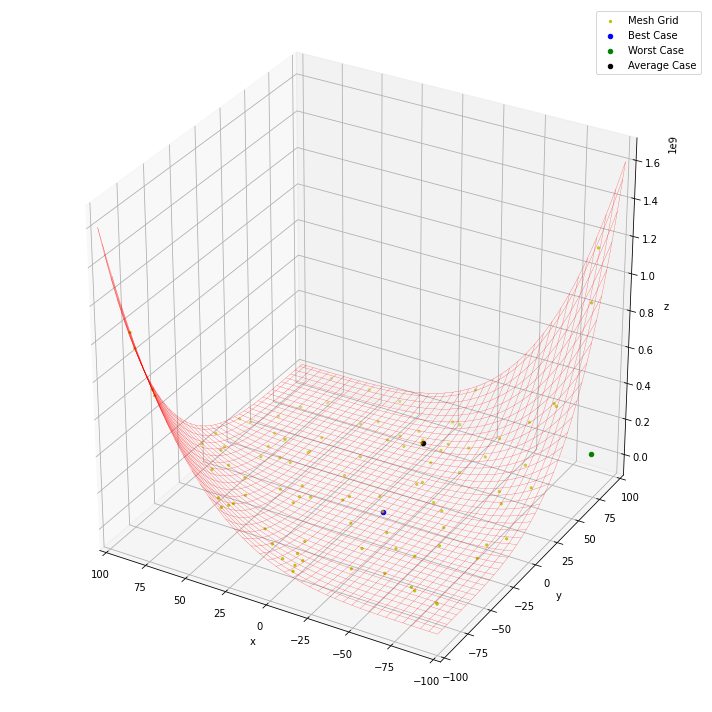

Global Best Position:  [-18.09308013 -13.10072803  47.07415558]
Best Fitness Value:  3467.567428811626


Global Worst Position:  [-86.26942378  92.19564586  22.21302911]
Worst Fitness Value:  1014313286.507378


Global Average Position:  [  0.99558053  54.68939518 -61.25000518]
Average Fitness Value:  71497882.69966005


Number of Generation:  1


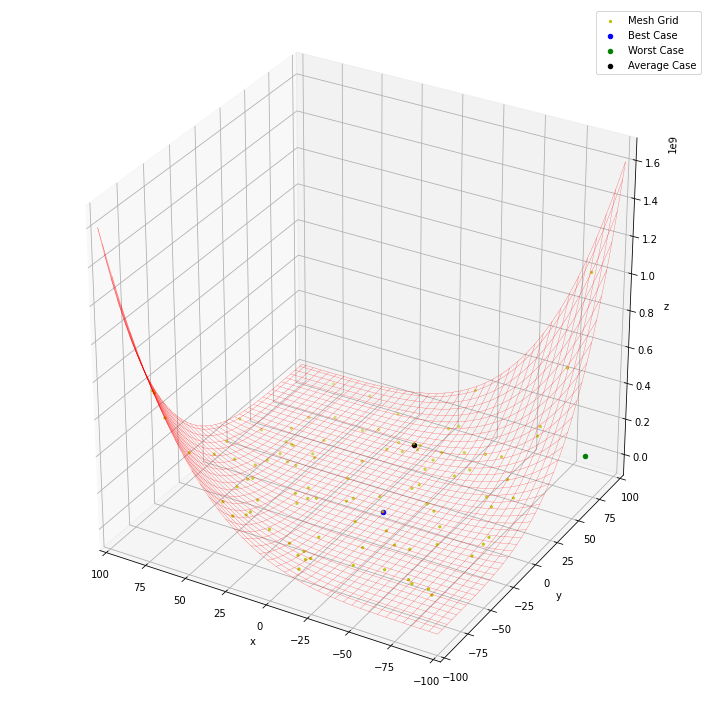

Global Best Position:  [11.2520463   4.21318232 37.27580365]
Best Fitness Value:  3013.6112921572494


Global Worst Position:  [-79.2293981   81.32253157  24.78023878]
Worst Fitness Value:  664372553.9240226


Global Average Position:  [64.46897978 18.45129959  1.69562085]
Average Fitness Value:  43654874.49415513


Number of Generation:  2


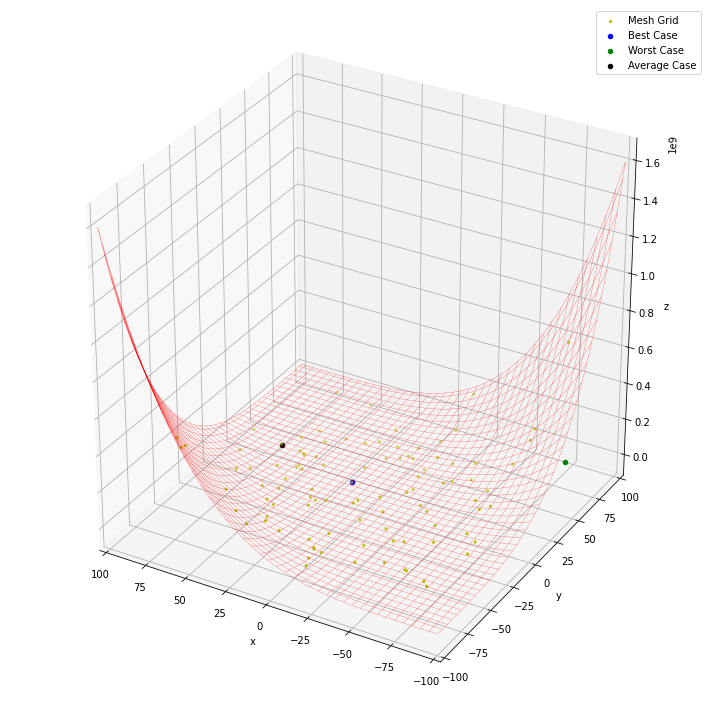

Global Best Position:  [ 8.40228693  2.53179654 38.22733968]
Best Fitness Value:  1434.0788358882323


Global Worst Position:  [ 54.28356171 -78.80616871 -66.80385118]
Worst Fitness Value:  313694517.75287306


Global Average Position:  [ 39.10506602   1.2485599  -13.78510917]
Average Fitness Value:  23363119.07465466


Number of Generation:  3


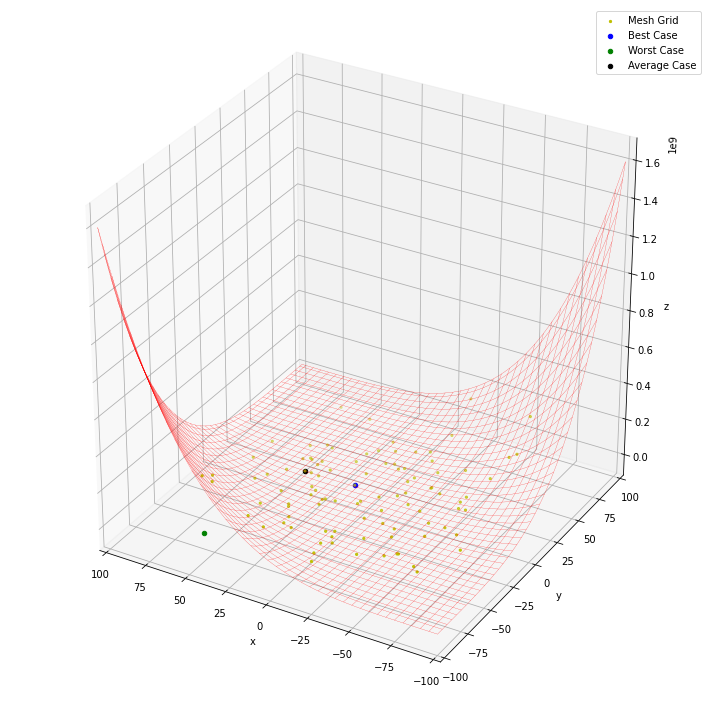

Global Best Position:  [ 5.91830915  1.06622546 39.05674107]
Best Fitness Value:  622.1304209818744


Global Worst Position:  [ 45.46443178 -65.89636868 -48.86990606]
Worst Fitness Value:  153754387.24253717


Global Average Position:  [-32.76897375  -3.61976587   3.20711059]
Average Fitness Value:  11176146.517082658


Number of Generation:  4


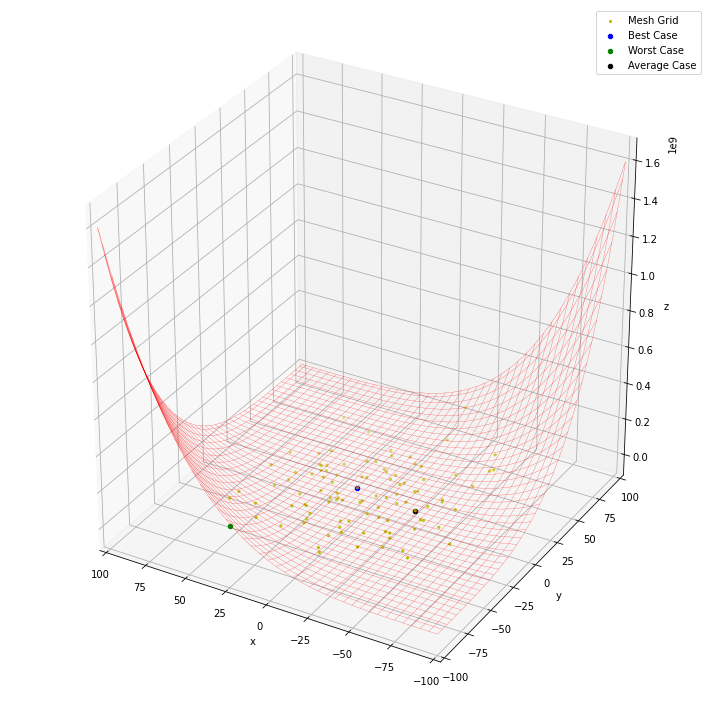

Global Best Position:  [ 3.2014378   4.92586554 32.08047075]
Best Fitness Value:  196.80525376459076


Global Worst Position:  [-12.05605252  81.49956564  74.56719703]
Worst Fitness Value:  76597246.38755766


Global Average Position:  [29.59128573  8.86699765  9.51928631]
Average Fitness Value:  4985558.250572987


Number of Generation:  5


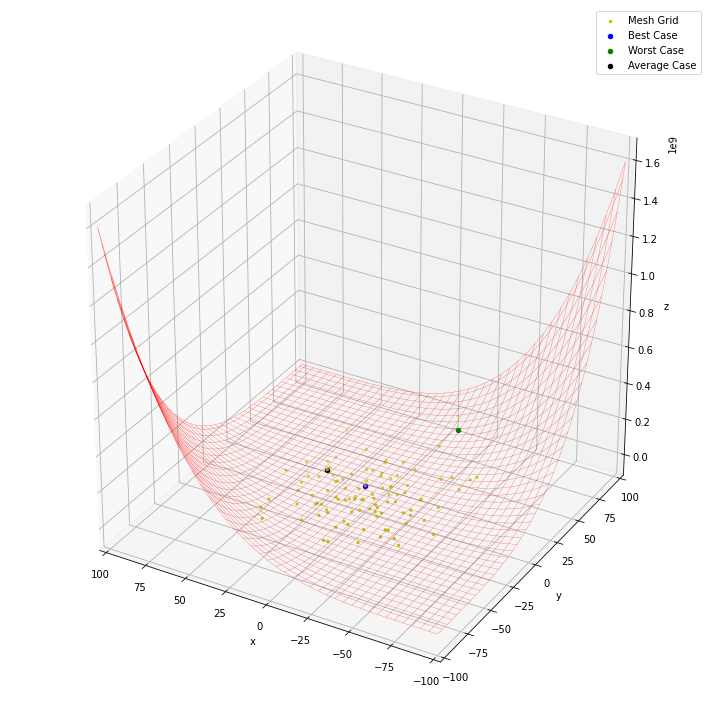

Global Best Position:  [ 0.04375568  1.28545032 35.69982547]
Best Fitness Value:  1.293808121345788


Global Worst Position:  [-11.21963093  76.9891825   72.59683075]
Worst Fitness Value:  60530486.93236035


Global Average Position:  [ 1.38549322 17.89261193 13.21129479]
Average Fitness Value:  2368308.5670371456


Number of Generation:  6


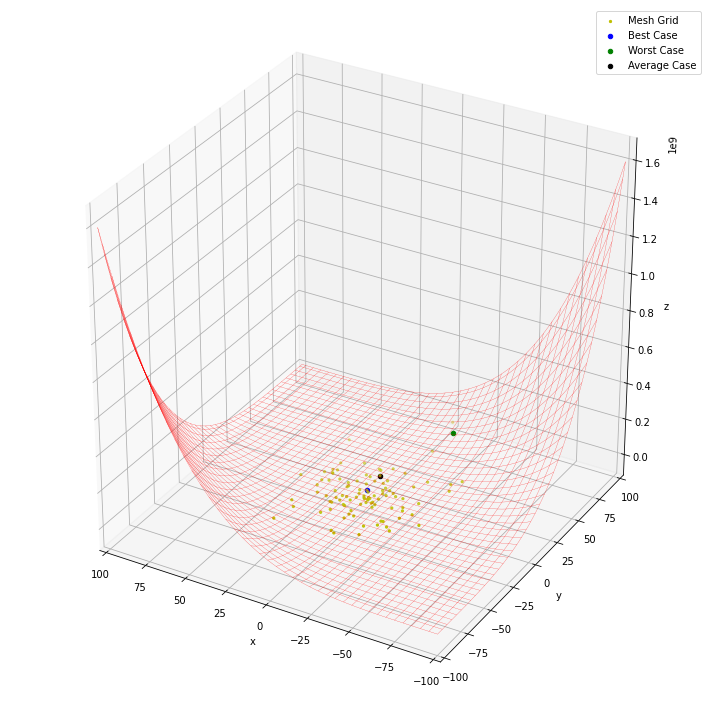

Global Best Position:  [ 0.77335578  0.68735055 34.74070176]
Best Fitness Value:  3.292847752811703


Global Worst Position:  [-10.51554605  73.01564504  70.81579749]
Worst Fitness Value:  48675813.37362953


Global Average Position:  [28.78518052 34.36847428 31.25785069]
Average Fitness Value:  1330221.9222943697


Number of Generation:  7


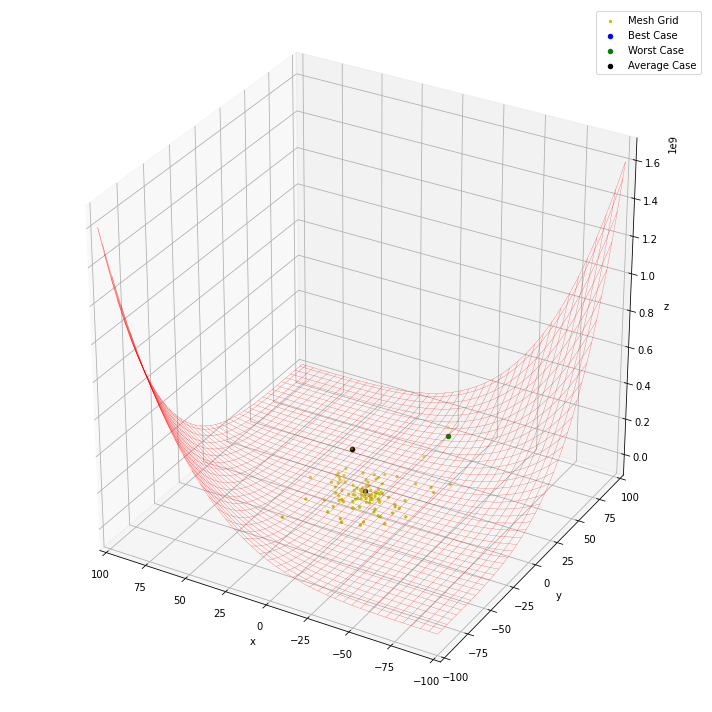

Global Best Position:  [-0.13041142  0.59773447 37.01273101]
Best Fitness Value:  -2.9261626831213268


Global Worst Position:  [-9.90856667 69.5479024  69.24356291]
Worst Fitness Value:  39849948.719016336


Global Average Position:  [-17.23946866  -8.92743128  36.02021944]
Average Fitness Value:  826976.0382618569


Number of Generation:  8


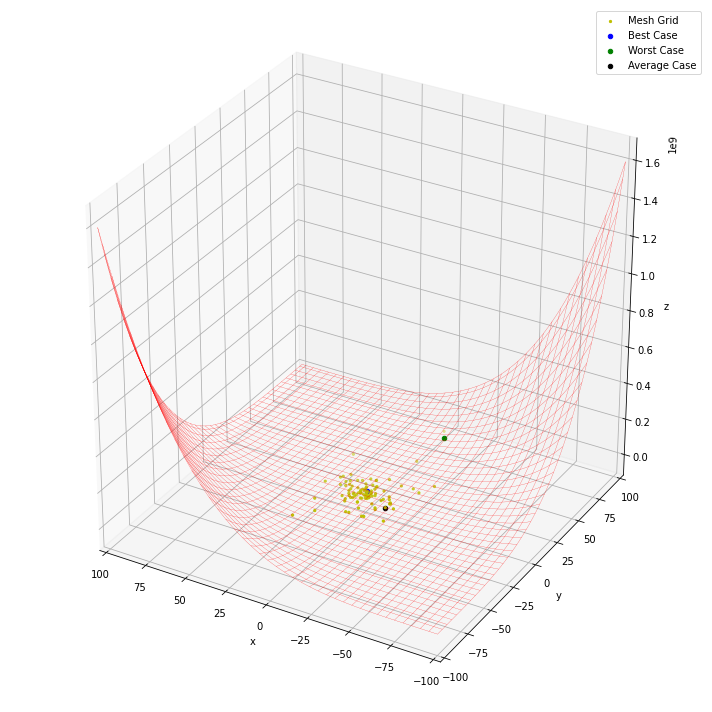

Global Best Position:  [ 1.16270429 -0.33686526 39.08177647]
Best Fitness Value:  -4.142974293361005


Global Worst Position:  [-9.06040797 64.28533696 66.826684  ]
Worst Fitness Value:  28933158.79601093


Global Average Position:  [-5.3938583   0.78114396 37.31191278]
Average Fitness Value:  521787.15975221246


Number of Generation:  9


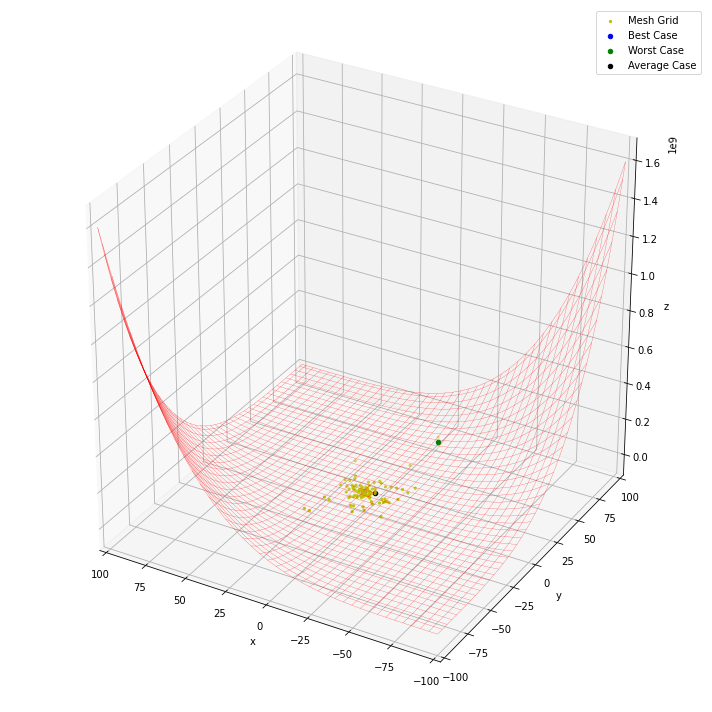

Global Best Position:  [ 0.768478   -0.94933926 38.69149819]
Best Fitness Value:  -4.7645852995433176


Global Worst Position:  [-8.07981085 58.16455467 64.07488024]
Worst Fitness Value:  19251740.738884192


Global Average Position:  [ 7.8732747   5.55481227 32.78131024]
Average Fitness Value:  406474.49299475306


Number of Generation:  10


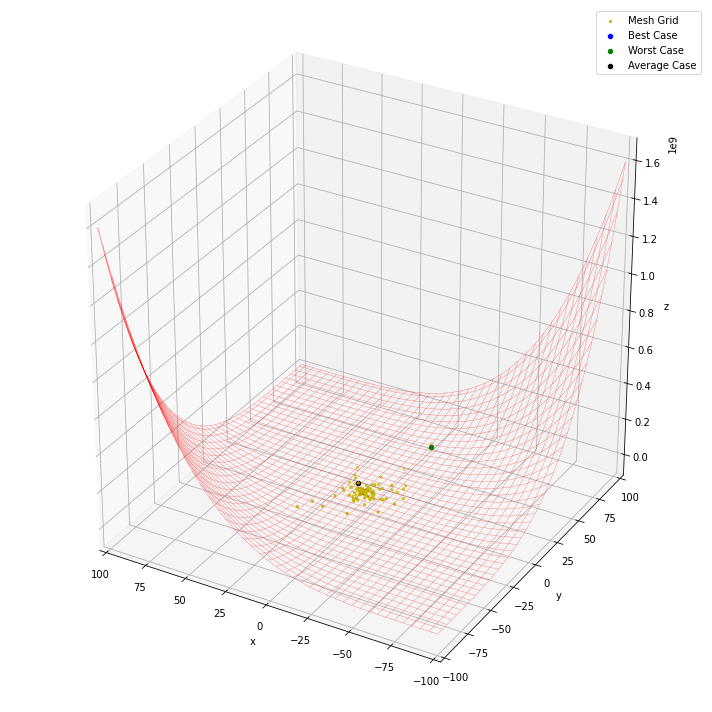

Global Best Position:  [ 0.23510331 -1.06850252 38.61617891]
Best Fitness Value:  -4.4301874717140795


Global Worst Position:  [-6.62824083 48.83961801 59.96377235]
Worst Fitness Value:  9462148.344596507


Global Average Position:  [-3.81393479  1.96986457 43.06011916]
Average Fitness Value:  284074.2441263505


Number of Generation:  11


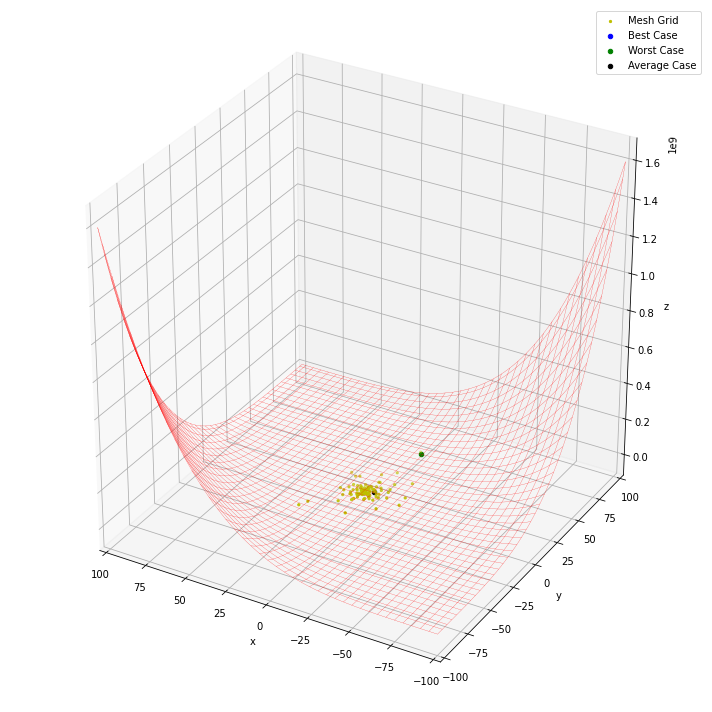

Global Best Position:  [ 0.82470515 -0.49700373 36.30731181]
Best Fitness Value:  -6.188577513136319


Global Worst Position:  [ 23.66010628 -28.44595306  52.61050906]
Worst Fitness Value:  7363318.393768096


Global Average Position:  [-8.9243497  -6.74577706 44.64513984]
Average Fitness Value:  192902.5645505302


Number of Generation:  12


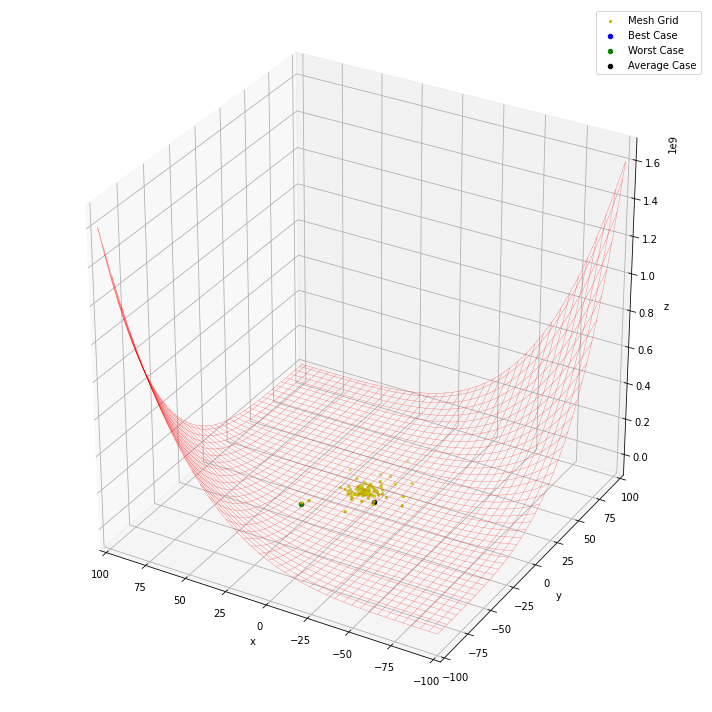

Global Best Position:  [ 0.78690604 -0.27056874 37.80477213]
Best Fitness Value:  -5.3619313365913985


Global Worst Position:  [ 23.37062217 -25.91139174  51.05833508]
Worst Fitness Value:  5891346.691801


Global Average Position:  [ 8.73661909  7.02454264 42.09319062]
Average Fitness Value:  126925.77237995609


Number of Generation:  13


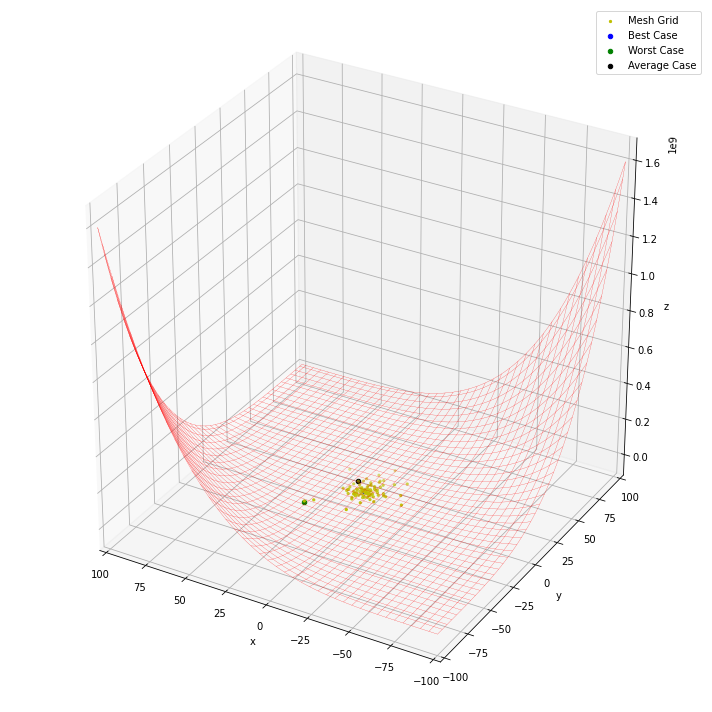

Global Best Position:  [ 0.62044121 -0.08863677 37.53469079]
Best Fitness Value:  -4.116205496609268


Global Worst Position:  [ 21.3893141  -21.65721205  48.63938487]
Worst Fitness Value:  3428016.808755571


Global Average Position:  [ 5.2775632  -0.3262577  44.86564804]
Average Fitness Value:  76144.13606207972


Number of Generation:  14


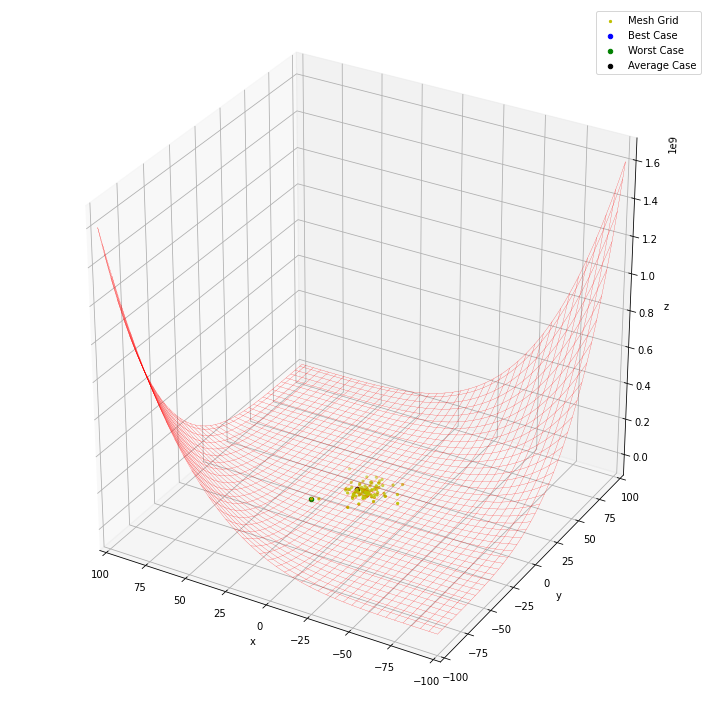

Global Best Position:  [ 0.35488067 -0.10005551 37.56094223]
Best Fitness Value:  -3.83819405919385


Global Worst Position:  [ 18.03730627 -16.72414941  45.94842037]
Worst Fitness Value:  1456473.3264620558


Global Average Position:  [ 1.26171241 -4.15488694 33.86010314]
Average Fitness Value:  41768.13365171599


Number of Generation:  15


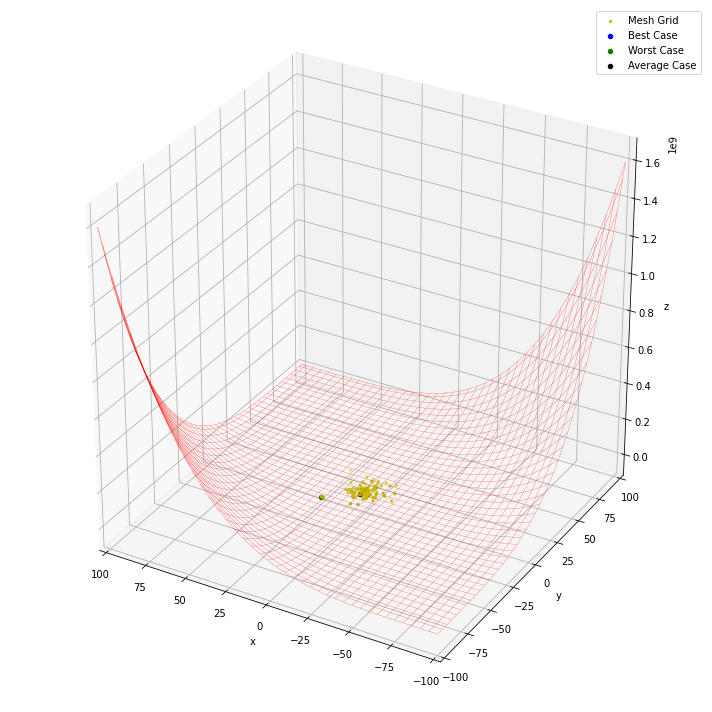

Global Best Position:  [ 0.41490602 -0.45622513 38.09206802]
Best Fitness Value:  -5.56673490563297


Global Worst Position:  [ 13.95990337 -14.52160647  40.37066319]
Worst Fitness Value:  655575.479219143


Global Average Position:  [-7.41299379 -2.78861042 43.92282336]
Average Fitness Value:  22140.847862250594


Number of Generation:  16


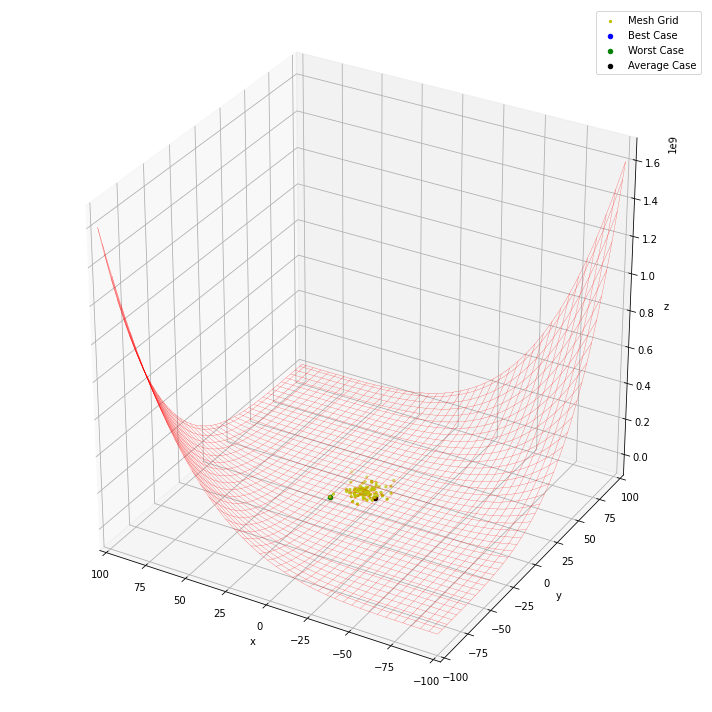

Global Best Position:  [ 0.34519677 -0.52328375 39.53891642]
Best Fitness Value:  -5.467205088749708


Global Worst Position:  [-9.52929016 21.41057575 49.4820566 ]
Worst Fitness Value:  913955.6141769614


Global Average Position:  [-7.10810894 -2.6029416  43.70128431]
Average Fitness Value:  18104.65204541121


Number of Generation:  17


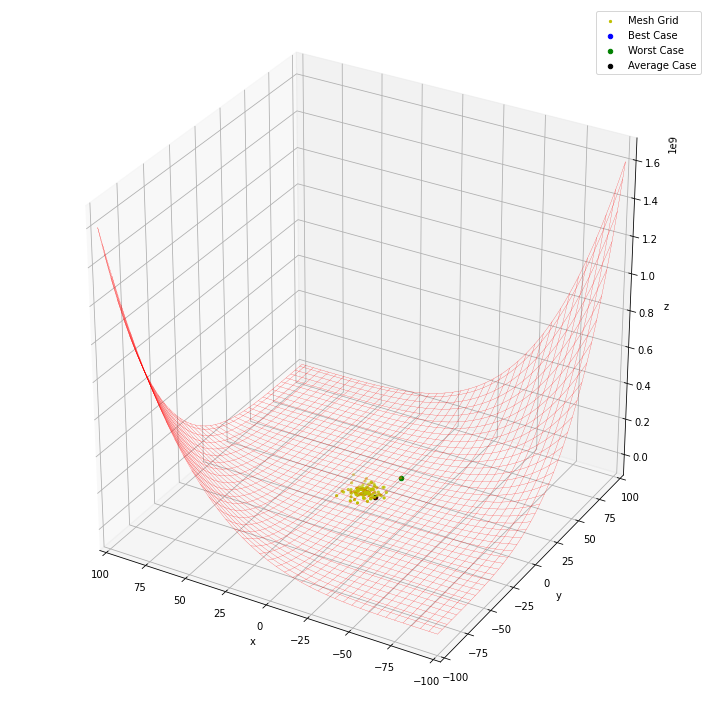

Global Best Position:  [ 0.31109967 -0.4825487  37.90059266]
Best Fitness Value:  -5.198351309906302


Global Worst Position:  [-11.1587524   24.73701676  51.49521162]
Worst Fitness Value:  1656968.8247852041


Global Average Position:  [-6.12408953 -5.29063937 41.62866331]
Average Fitness Value:  22453.432314501708


Number of Generation:  18


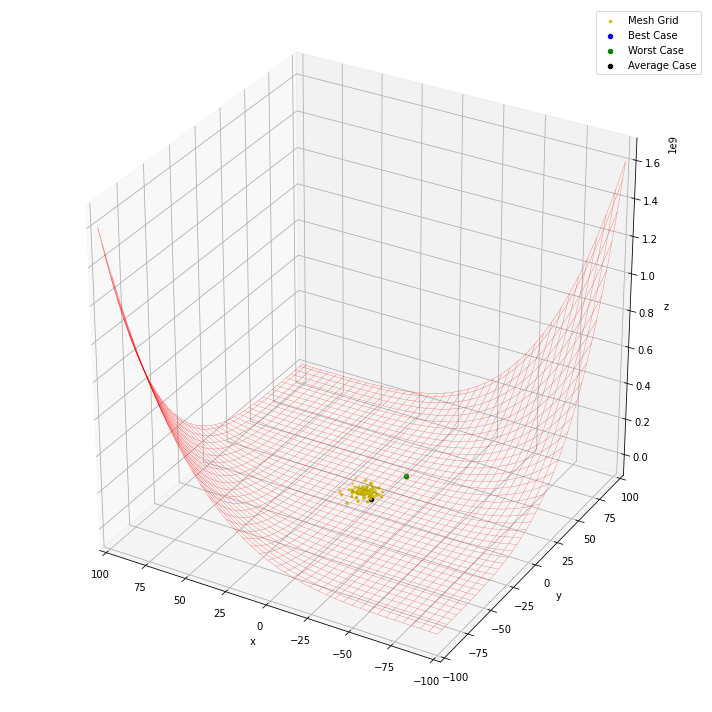

Global Best Position:  [ 0.90496268 -0.55060222 38.5813939 ]
Best Fitness Value:  -5.946099330816926


Global Worst Position:  [-11.79669026  25.99297512  52.2981618 ]
Worst Fitness Value:  2035707.1802465476


Global Average Position:  [-1.30457369  2.63817767 40.5009043 ]
Average Fitness Value:  25046.583129737774


Number of Generation:  19


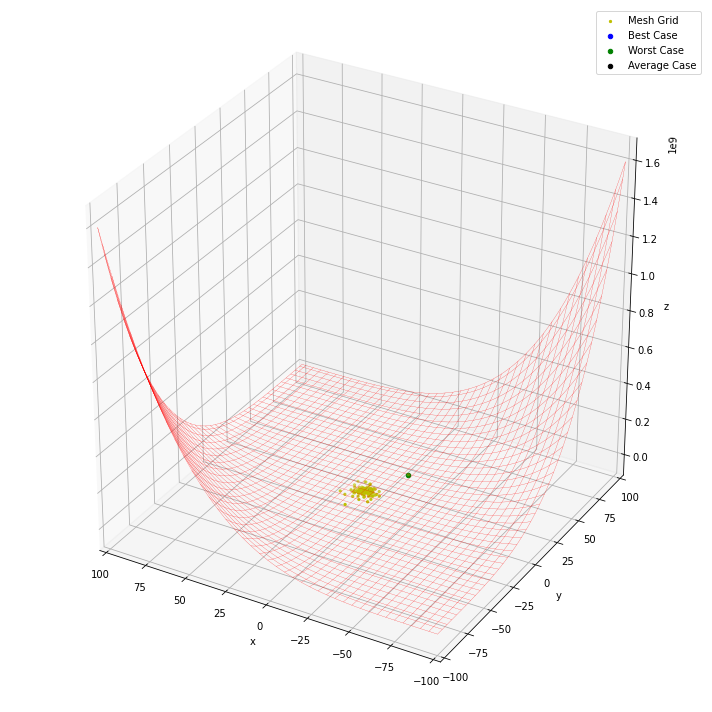

Global Best Position:  [ 0.68489621 -0.67487    37.95601737]
Best Fitness Value:  -6.4876886609029905


Global Worst Position:  [-11.92871877  26.22795636  52.50120536]
Worst Fitness Value:  2116018.337660527


Global Average Position:  [-2.11886566  1.25443018 38.85177016]
Average Fitness Value:  24970.704103385913


Number of Generation:  20


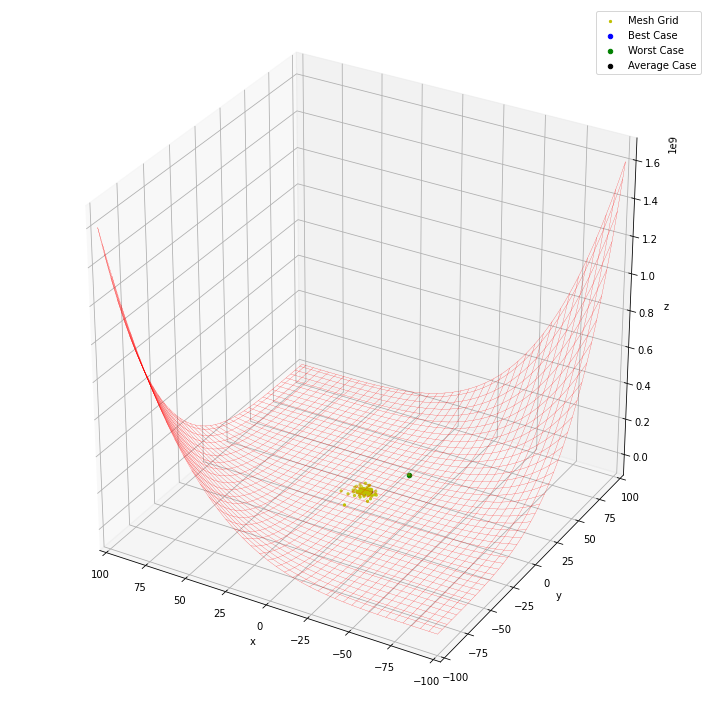

Global Best Position:  [ 0.69764136 -0.53241273 38.46943133]
Best Fitness Value:  -6.39798273836756


Global Worst Position:  [-11.40353682  25.06475951  51.94253215]
Worst Fitness Value:  1765335.0039487057


Global Average Position:  [-0.61267445  2.26594421 37.10191159]
Average Fitness Value:  20418.384597834844


Number of Generation:  21


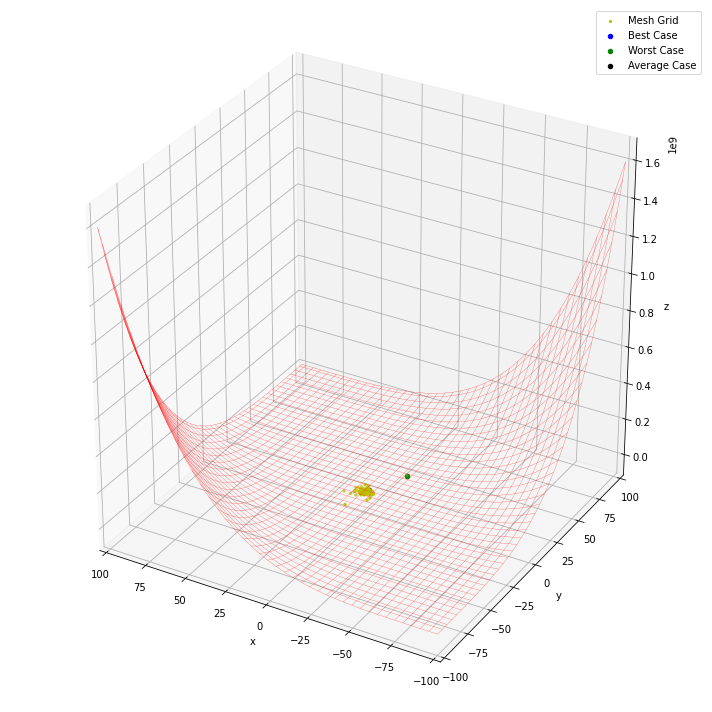

Global Best Position:  [ 0.61310177 -0.53045141 38.40452825]
Best Fitness Value:  -6.336085979713856


Global Worst Position:  [-10.57471604  23.2660457   51.04242973]
Worst Fitness Value:  1308554.9826187482


Global Average Position:  [-1.48263864 -1.29379362 38.50718731]
Average Fitness Value:  14883.027666514023


Number of Generation:  22


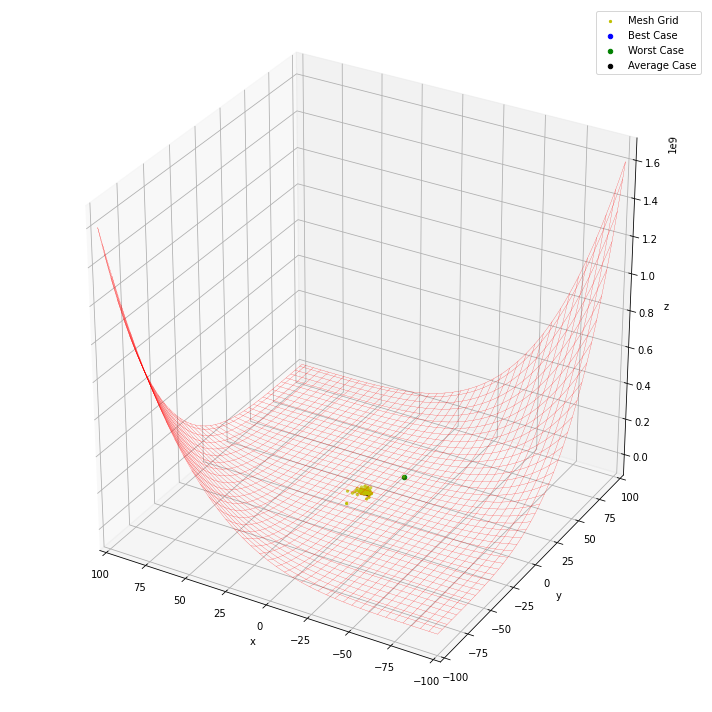

Global Best Position:  [ 0.67107561 -0.6098229  38.22202851]
Best Fitness Value:  -6.499846055815116


Global Worst Position:  [-9.52331251 21.00797416 49.8766883 ]
Worst Fitness Value:  866548.0145902454


Global Average Position:  [-0.25552112 -2.061314   37.75753069]
Average Fitness Value:  9750.06550238239


Number of Generation:  23


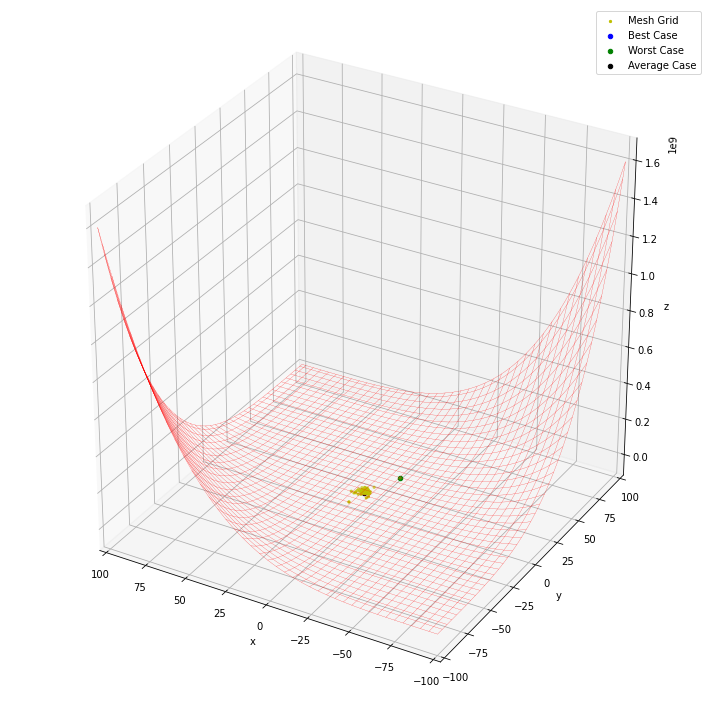

Global Best Position:  [ 0.655534   -0.70511806 38.21775844]
Best Fitness Value:  -6.47981261781221


Global Worst Position:  [-8.22689669 18.24108374 48.41717014]
Worst Fitness Value:  488998.5480094001


Global Average Position:  [-0.71147394 -0.75278733 39.36455199]
Average Fitness Value:  5574.742881491757


Number of Generation:  24


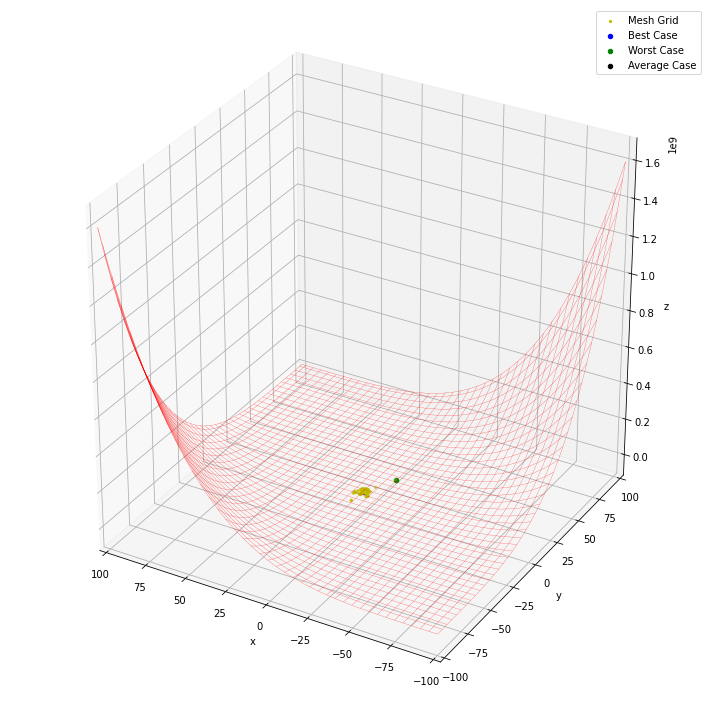

Global Best Position:  [ 0.60288776 -0.68792678 37.89094953]
Best Fitness Value:  -6.4914964743461265


Global Worst Position:  [-7.45535002 16.59452994 47.54627054]
Worst Fitness Value:  333079.2065864513


Global Average Position:  [ 0.68012545  0.36092758 38.20785799]
Average Fitness Value:  3811.2049712320604


Number of Generation:  25


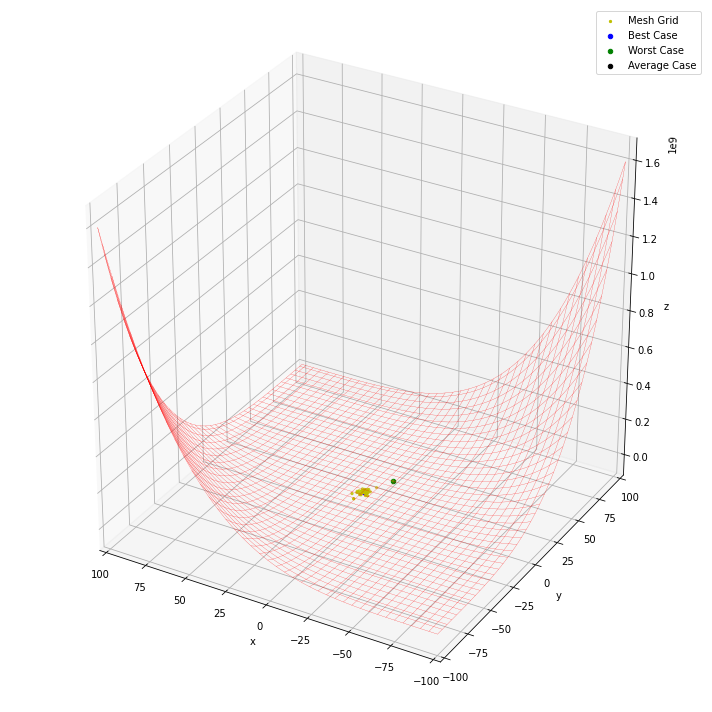

Global Best Position:  [ 0.67981865 -0.61548516 38.32601789]
Best Fitness Value:  -6.501270322171106


Global Worst Position:  [-6.21296357 13.93522533 46.09193618]
Worst Fitness Value:  163773.2090197742


Global Average Position:  [ 1.2628949  -0.07144086 37.85631731]
Average Fitness Value:  1976.4301802941443


Number of Generation:  26


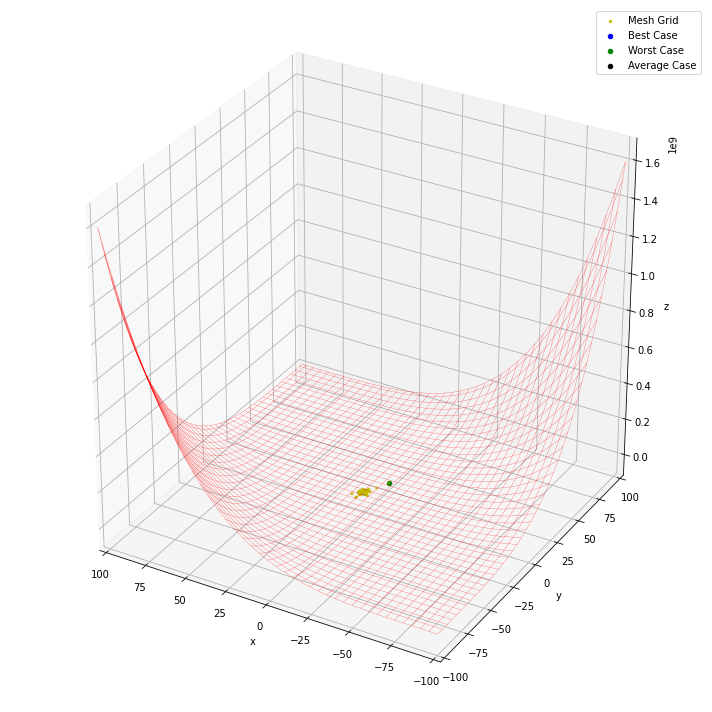

Global Best Position:  [ 0.62830817 -0.6403521  38.16468283]
Best Fitness Value:  -6.506235096411428


Global Worst Position:  [-5.15034246 11.66305867 44.85154215]
Worst Fitness Value:  79206.88307817286


Global Average Position:  [-0.85272323  0.66653083 34.64924874]
Average Fitness Value:  1017.2130228803414


Number of Generation:  27


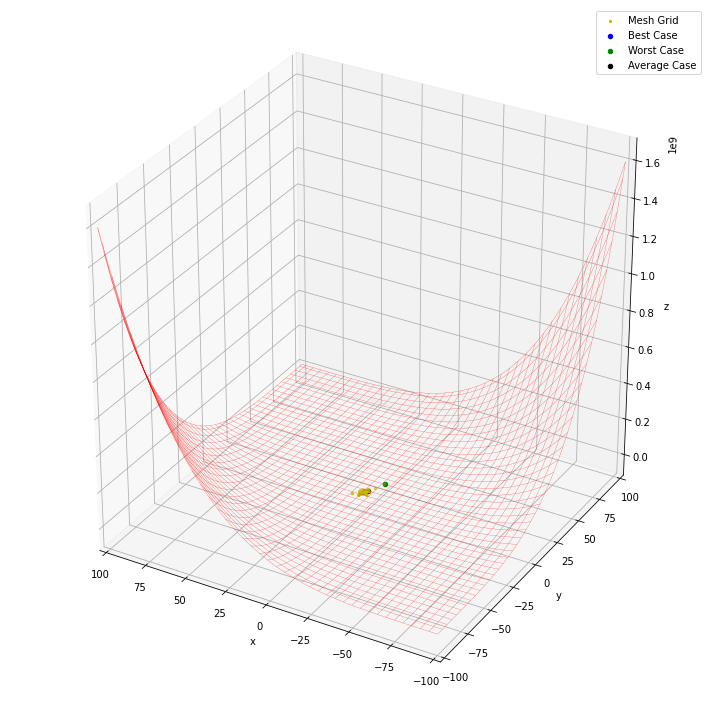

Global Best Position:  [ 0.61871863 -0.7032918  38.24800529]
Best Fitness Value:  -6.48919153801697


Global Worst Position:  [-4.09915258  9.41829131 43.62776437]
Worst Fitness Value:  32934.30294560147


Global Average Position:  [ 0.48302365 -1.22134673 38.31621754]
Average Fitness Value:  480.141634945977


Number of Generation:  28


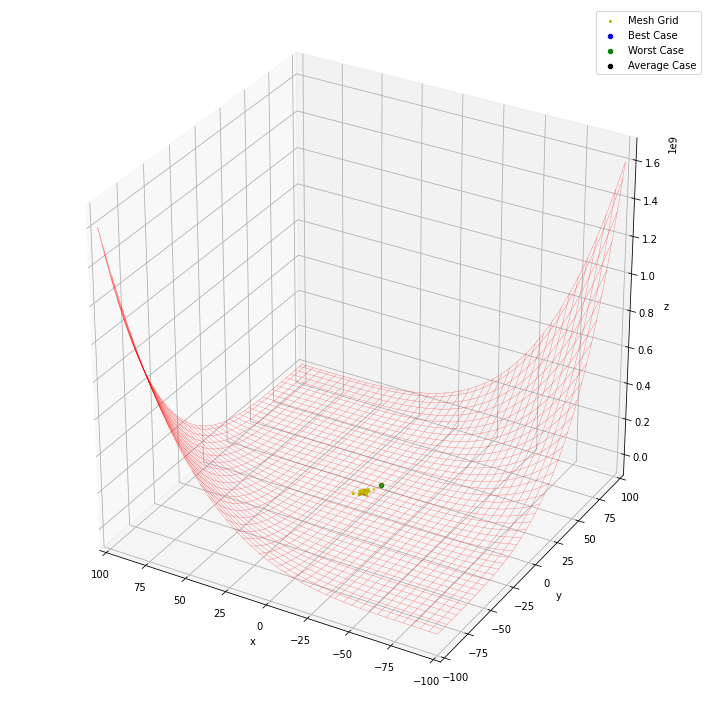

Global Best Position:  [ 0.67403379 -0.62911071 38.13715459]
Best Fitness Value:  -6.5078127230610185


Global Worst Position:  [-3.25926983  7.62193771 42.65678686]
Worst Fitness Value:  13728.49822147214


Global Average Position:  [ 0.1433442  -1.07702701 37.97946504]
Average Fitness Value:  240.3853021733009


Number of Generation:  29


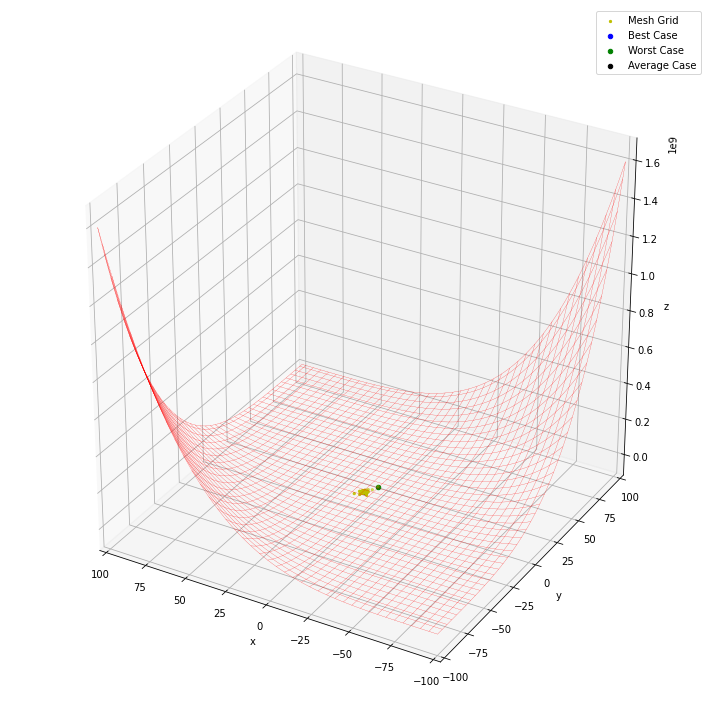

Global Best Position:  [ 0.65584348 -0.62249842 38.24096826]
Best Fitness Value:  -6.507007850650977


Global Worst Position:  [ 3.92069789 -4.54783591 33.85106065]
Worst Fitness Value:  4917.757118560431


Global Average Position:  [ 0.65317573 -0.07682914 37.28584097]
Average Fitness Value:  111.57014224590935


Number of Generation:  30


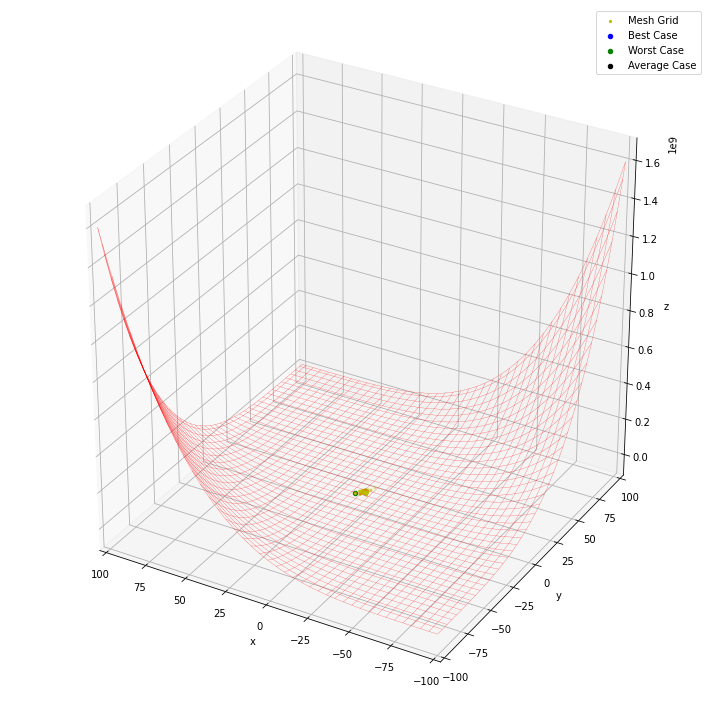

Global Best Position:  [ 0.6373516  -0.65916893 38.24262116]
Best Fitness Value:  -6.512344035022068


Global Worst Position:  [ 3.49577233 -4.09787643 34.40560985]
Worst Fitness Value:  3142.5828345318837


Global Average Position:  [ 0.12228711 -0.72403959 37.24577301]
Average Fitness Value:  53.84655690806744


Number of Generation:  31


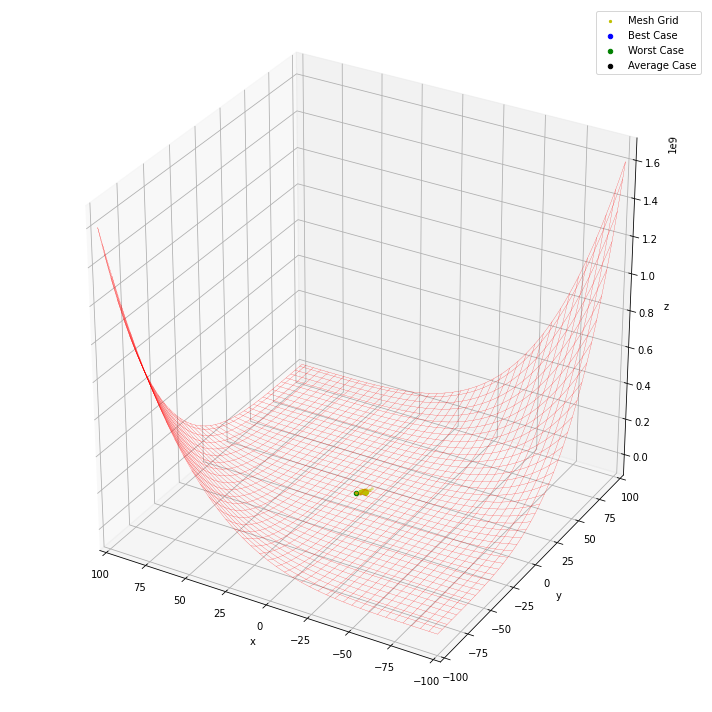

Global Best Position:  [ 0.67614324 -0.63456745 38.22055067]
Best Fitness Value:  -6.508017393853136


Global Worst Position:  [ 2.99636228 -3.53636361 35.06582538]
Worst Fitness Value:  1684.5968612805093


Global Average Position:  [ 0.23225401 -0.31178867 38.29747191]
Average Fitness Value:  26.539491334908245


Number of Generation:  32


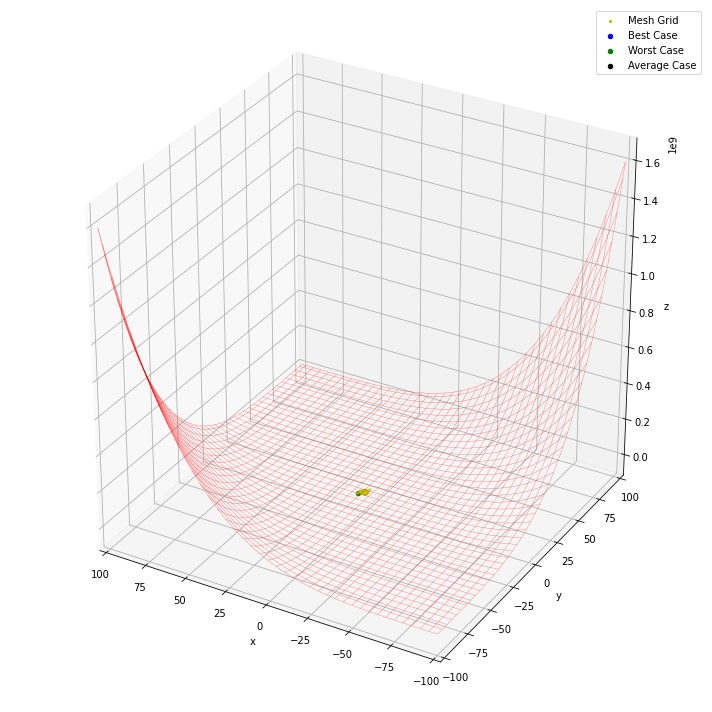

Global Best Position:  [ 0.62617024 -0.63207861 38.19044672]
Best Fitness Value:  -6.501223517313605


Global Worst Position:  [ 2.5610616  -3.04022389 35.64329003]
Worst Fitness Value:  882.3172277395557


Global Average Position:  [ 0.52212834 -1.11051179 37.89724394]
Average Fitness Value:  13.402627241948137


Number of Generation:  33


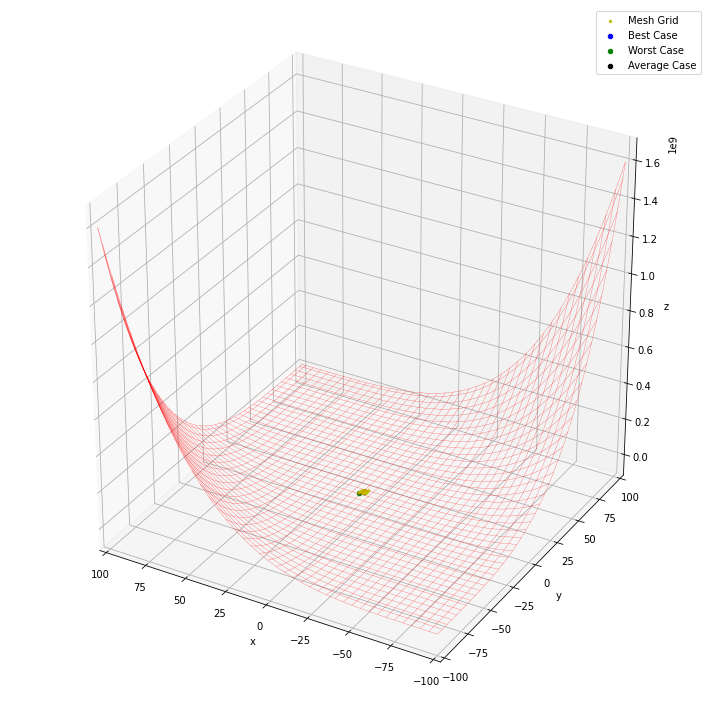

Global Best Position:  [ 0.63257336 -0.65900531 38.18633009]
Best Fitness Value:  -6.511199739191626


Global Worst Position:  [ 2.2315022  -2.66097764 36.08012826]
Worst Fitness Value:  493.8010738271275


Global Average Position:  [ 0.55750452 -0.17802424 37.23196086]
Average Fitness Value:  6.50133196580604


Number of Generation:  34


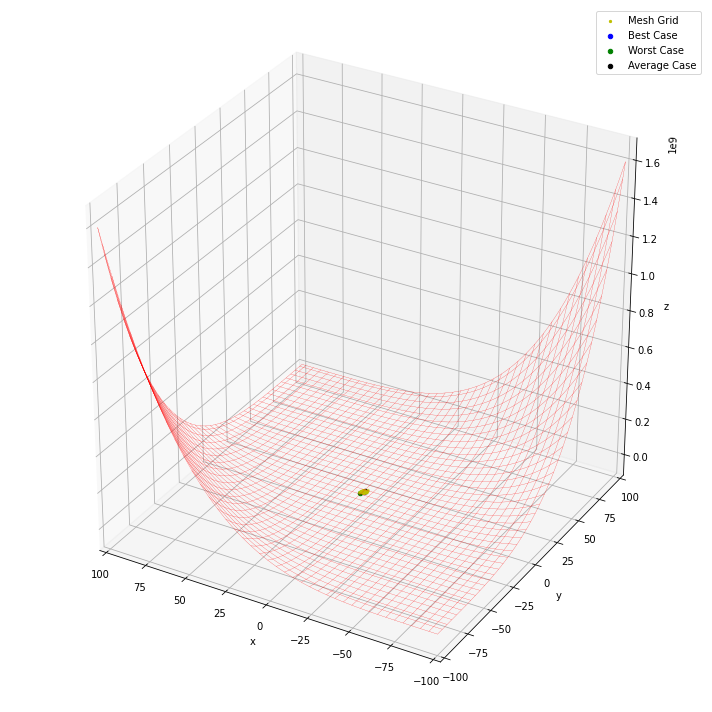

Global Best Position:  [ 0.65127806 -0.66224072 38.19467303]
Best Fitness Value:  -6.512383916885907


Global Worst Position:  [ 1.84538042 -2.20431305 36.59093548]
Worst Fitness Value:  213.09731738234325


Global Average Position:  [ 0.35975958 -0.38558888 38.23734736]
Average Fitness Value:  1.4243143988840183


Number of Generation:  35


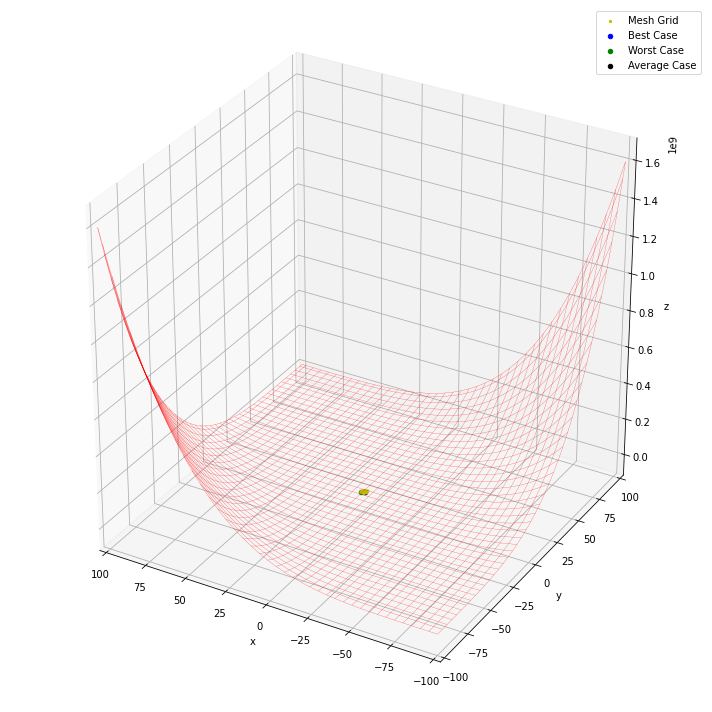

Global Best Position:  [ 0.66644069 -0.66486344 38.20143609]
Best Fitness Value:  -6.507110875610833


Global Worst Position:  [ 1.55648537 -1.85786507 36.97400365]
Worst Fitness Value:  94.78881371577135


Global Average Position:  [ 0.42872394 -0.42716507 38.26492765]
Average Fitness Value:  -1.4530055876341499


Number of Generation:  36


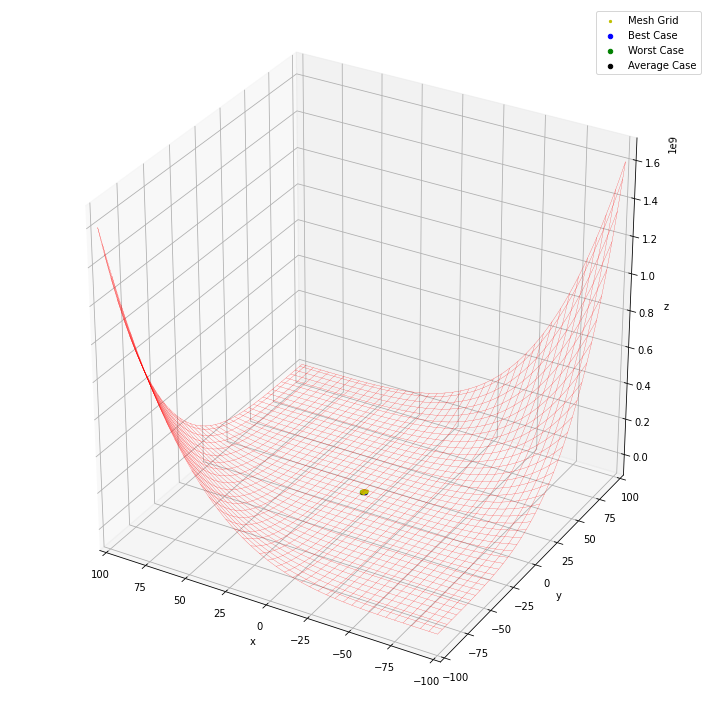

In [18]:
particles,gbest_pos, gworst_pos, gavg_pos=PSO(population, dimension, 
                                                 position_min, position_max, 
                                                 generation, fitness_criterion)

Best Objective function Value

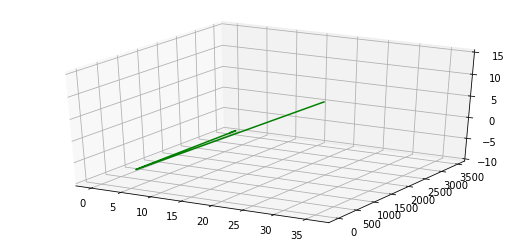

In [24]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
zline = np.linspace(-10, 15, len(best))
xline = [i for i in range(len(best))]
yline = best
ax.plot3D(xline, yline, zline, 'Green')

Worst Objective Function Value

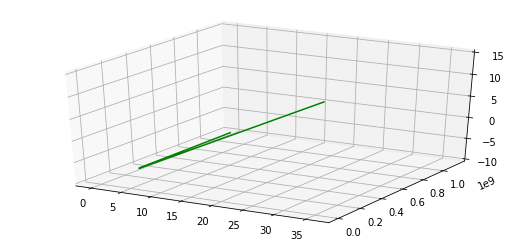

In [22]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
zline = np.linspace(-10, 15, len(best))
xline = [i for i in range(len(best))]
yline = worst
ax.plot3D(xline, yline, zline, 'Green')

Average Objective Function Value

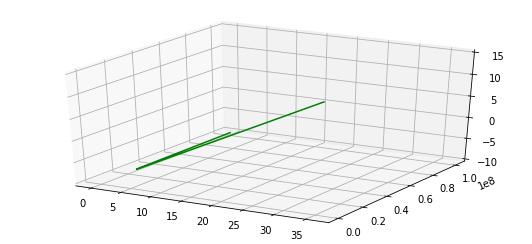

In [23]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
zline = np.linspace(-10, 15, len(best))
xline = [i for i in range(len(best))]
yline = average
ax.plot3D(xline, yline, zline, 'Green')

2D Plot Of All three function Values

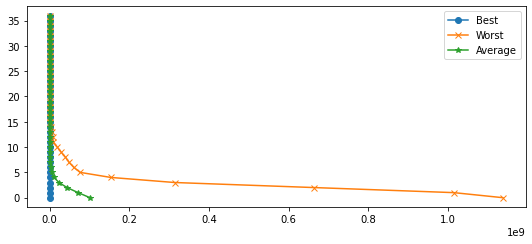

In [26]:
y=[i for i in range(len(best))]
plt.plot(best, y,label='Best',marker='o')
plt.plot(worst, y, label='Worst',marker='x')
plt.plot(average,y,label='Average',marker='*')
plt.legend()
plt.show()